# Fitting a temperature-continuum model to global X-LoVoCCS Spectra

## Import Statements

In [1]:
import pandas as pd
pd.set_option('display.max_columns', 500)
import numpy as np
from astropy.units import Quantity
from astropy.cosmology import LambdaCDM
from shutil import rmtree
from matplotlib import pyplot as plt
import os

import xga
# This just sets the number of cores this analysis is allowed to use
xga.NUM_CORES = 10
# This is a bodge that will only work because xga_output in notebooks has already been defined, XGA
#  will be made to handle this more gracefully at some point
temp_dir = xga.OUTPUT
actual_dir = temp_dir.split('notebooks/')[0]+'notebooks/xga_output/'
xga.OUTPUT = actual_dir
xga.utils.OUTPUT = actual_dir
# As currently XGA will setup an xga_output directory in our current directory, I remove it to keep it all clean
if os.path.exists('xga_output'):
    rmtree('xga_output')
from xga.samples import ClusterSample
from xga.xspec import multi_temp_dem_apec
from xga.exceptions import ModelNotAssociatedError, NoProductAvailableError

%matplotlib inline

## Define the cosmology

We make use of a concordance flat LambdaCDM cosmology during the course of this analysis:

In [2]:
cosmo = LambdaCDM(70, 0.3, 0.7)

## Reading the sample file

In [3]:
samp = pd.read_csv('../../outputs/results/ltr_r500_pipeline_results.csv')
samp = samp[~np.isnan(samp['r500'])]
samp.head(5)

,name,MCXC,LoVoCCSID,LoVoCCS_name,ra,dec,redshift,sub_samp,old_LoVoCCSID,r500,Tx500,Tx500-,Tx500+,Lx500_0.5-2.0,Lx500_0.5-2.0-,Lx500_0.5-2.0+,Lx500_0.01-100.0,Lx500_0.01-100.0-,Lx500_0.01-100.0+,Tx500ce,Tx500ce-,Tx500ce+,Lx500ce_0.5-2.0,Lx500ce_0.5-2.0-,Lx500ce_0.5-2.0+,Lx500ce_0.01-100.0,Lx500ce_0.01-100.0-,Lx500ce_0.01-100.0+
0,LoVoCCS-0,J1558.3+2713,0,LoVoCCS-0,239.585833,27.226944,0.0894,north,0,1241.367006,6.66383,0.034966,0.034934,6.556144e+44,2.218996e+43,2.430751e+43,2.447548e+45,8.681694e+43,7.742864e+43,6.79336,0.059572,0.059953,3.855936e+44,1.744255e+43,1.893153e+43,1.452341e+45,7.284100e+43,8.465869e+43
3,LoVoCCS-3,J1348.8+2635,3,LoVoCCS-3,207.220833,26.595556,0.0622,north,3,941.974183,4.37981,0.023780,0.023732,3.721798e+44,6.300962e+41,6.635368e+41,1.141619e+45,3.321196e+42,3.115630e+42,4.53615,0.046741,0.047531,1.877253e+44,7.970320e+41,4.609245e+41,5.852525e+44,3.922180e+42,3.150757e+42
6,LoVoCCS-6,J1524.1+2955,6,LoVoCCS-6,231.040833,29.921111,0.1145,north,5,1099.734136,5.47033,0.084737,0.085412,1.780977e+44,8.760975e+41,9.586821e+41,6.073220e+44,4.736396e+42,4.681046e+42,5.40377,0.079978,0.093708,1.641826e+44,6.788310e+41,1.102298e+42,5.566223e+44,4.019203e+42,4.603645e+42
7,LoVoCCS-7,J2201.9-5956,7,LoVoCCS-7,330.483333,-59.949444,0.0980,south,6,1146.082387,5.85487,0.059704,0.059693,1.421557e+44,1.046320e+42,9.904382e+41,5.001792e+44,2.829098e+42,4.607814e+42,5.66984,0.077693,0.077662,7.051462e+43,8.832195e+41,6.420786e+41,2.443961e+44,3.264580e+42,2.288599e+42
8,LoVoCCS-8,J1702.7+3403,8,LoVoCCS-8,255.678750,34.061944,0.0953,north,7,1059.495507,5.03500,0.035447,0.035468,2.919277e+44,7.413151e+41,8.250355e+41,9.563413e+44,3.271480e+42,3.961362e+42,4.99082,0.054962,0.054961,1.688042e+44,5.473457e+41,8.766637e+41,5.506826e+44,2.677203e+42,3.494326e+42


## Set up an XGA ClusterSample 

In [5]:
ra = samp['ra'].values
dec = samp['dec'].values
name = samp['LoVoCCS_name'].values
z = samp['redshift'].values
r500 = Quantity(samp['r500'].values, 'kpc')

srcs = ClusterSample(ra, dec, z, name, r500=r500, use_peak=False, clean_obs=True, clean_obs_reg='r500', 
                     clean_obs_threshold=0.7, cosmology=cosmo, load_fits=True)

Declaring BaseSource Sample:   0%|          | 0/85 [00:00<?, ?it/s]/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/astropy/units/quantity.py:611: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
Setting up Galaxy Clusters:   0%|          | 0/85 [00:00<?, ?it/s]/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/astropy/units/quantity.py:611: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division


ZeroDivisionError: float division

Exception ignored in: 'regions._geometry.elliptical_overlap.elliptical_overlap_single_subpixel'
Traceback (most recent call last):
  File "/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/regions/shapes/ellipse.py", line 175, in to_mask
    fraction = elliptical_overlap_grid(
ZeroDivisionError: float division
Setting up Galaxy Clusters: 100%|██████████| 85/85 [02:29<00:00,  1.75s/it]
/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/xga/samples/extended.py:246: UserWarning: Non-fatal warnings occurred during the declaration of some sources, to access them please use the suppressed_warnings property of this sample.
  self._check_source_warnings()


## Fitting a temperature-continuum plasma model 

In [ ]:
multi_temp_dem_apec(srcs, srcs.r500, start_t_rat=0.5, start_inv_em_slope=1.5, freeze_met=True, 
                    timeout=Quantity(5, 'hr'), num_cores=5, spectrum_checking=False)

## 

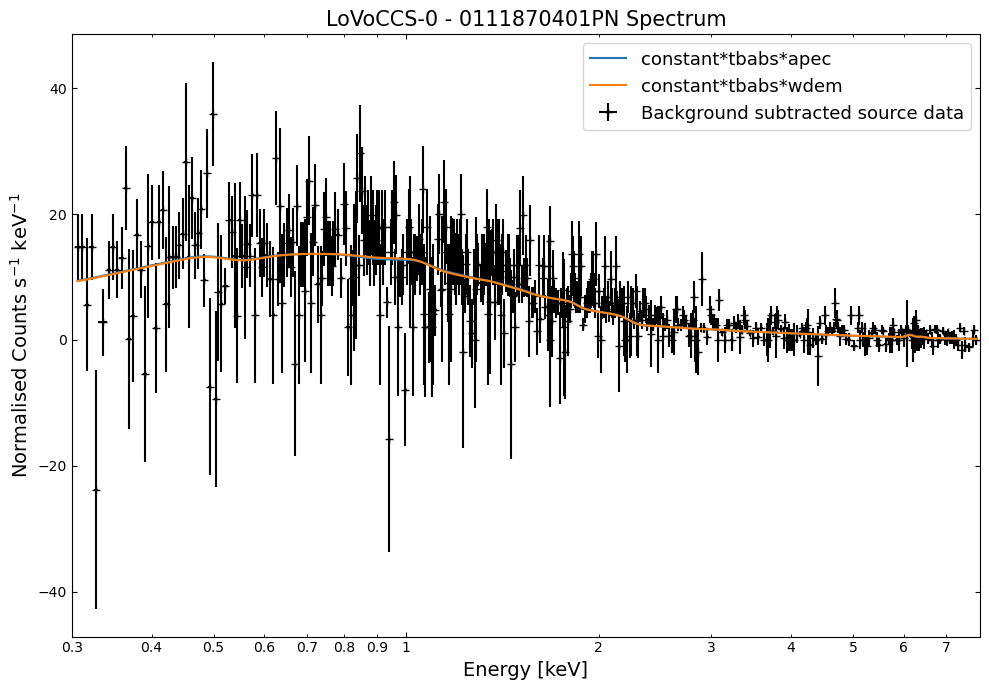

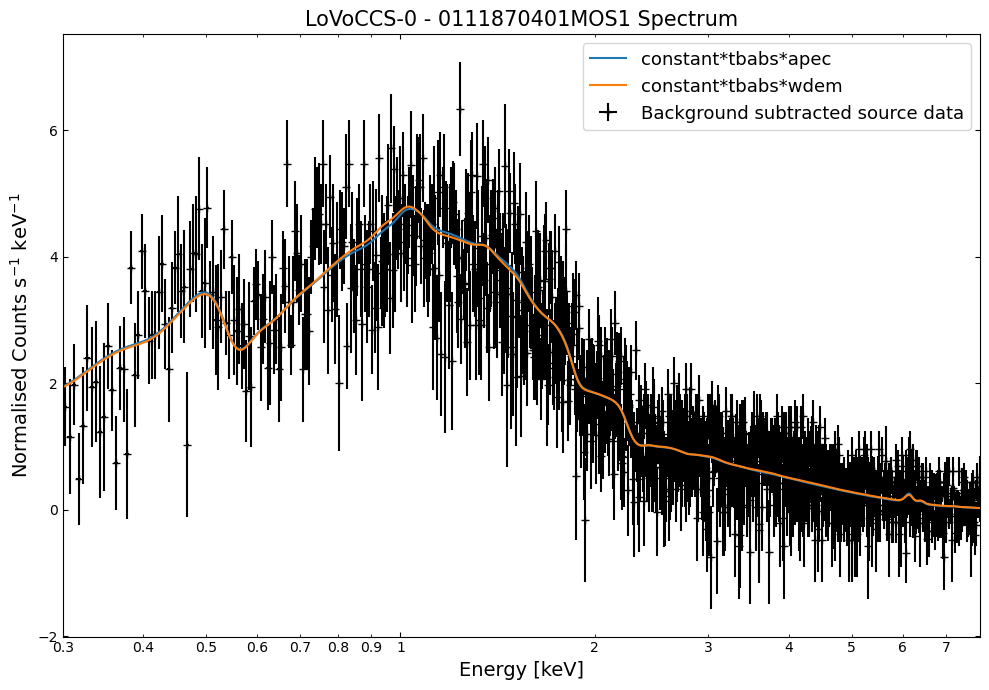

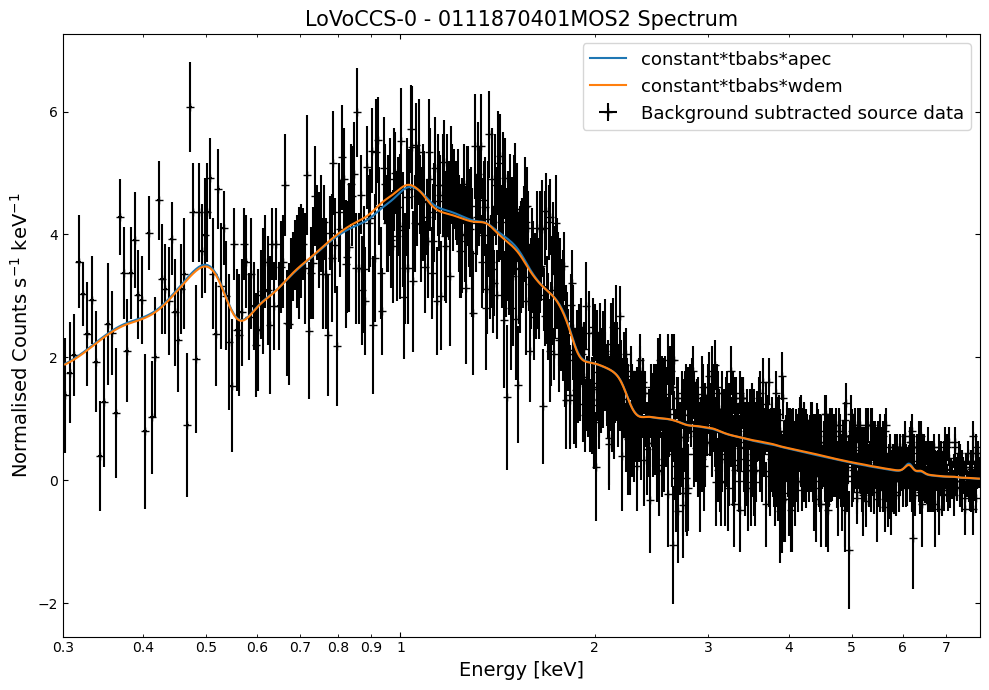

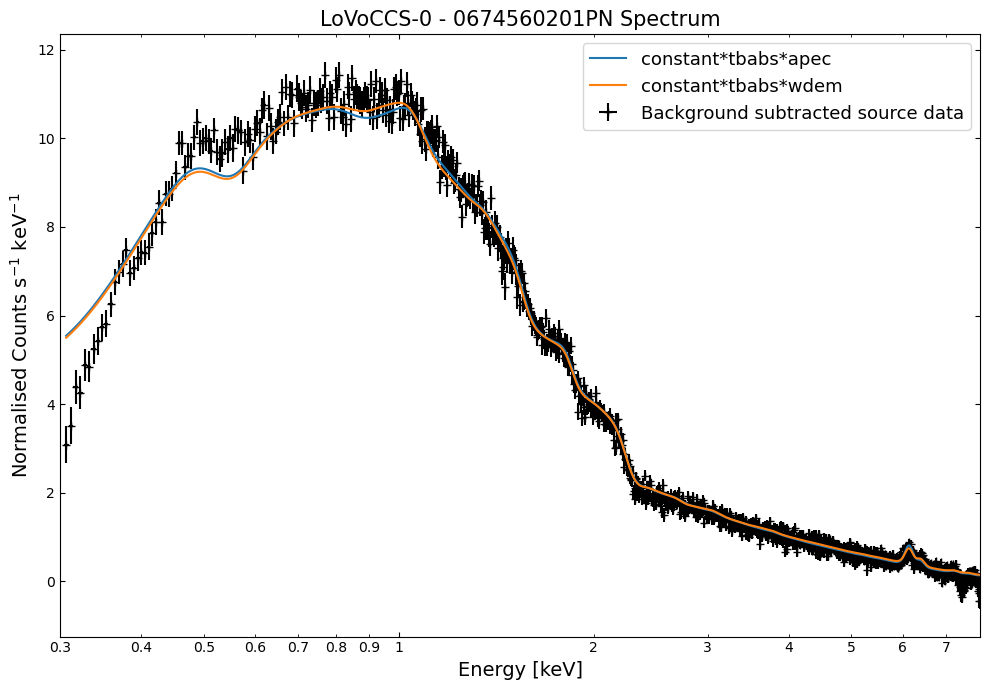

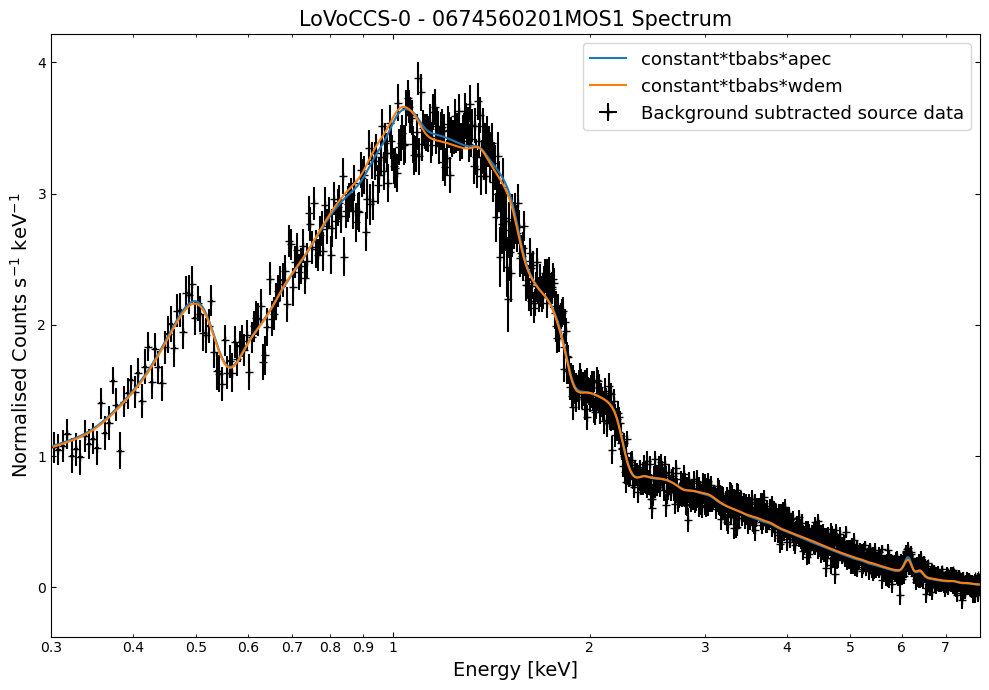

...

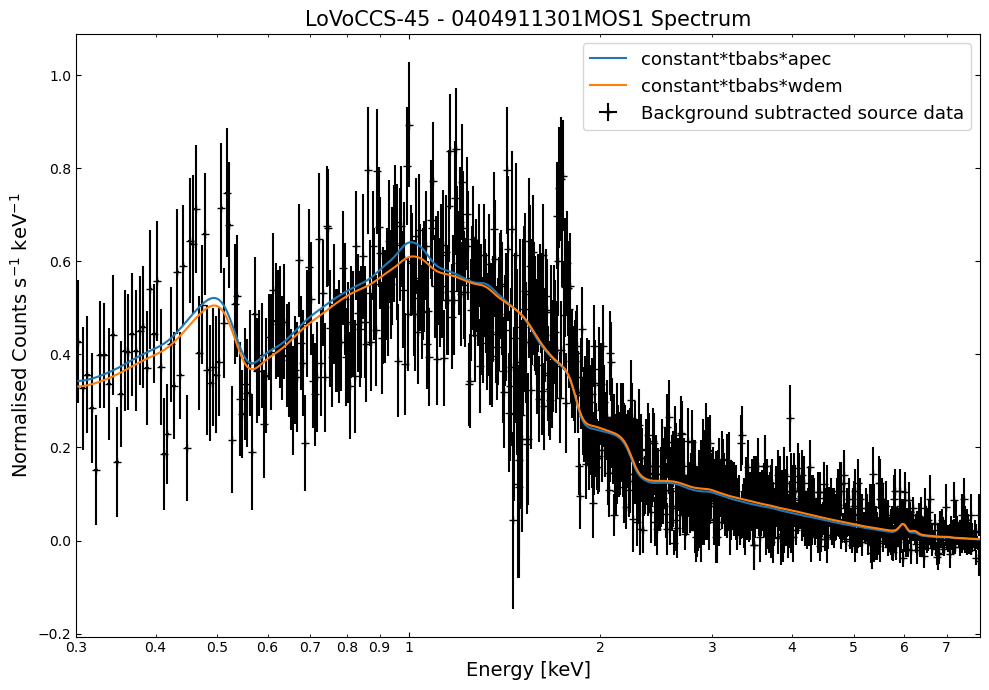

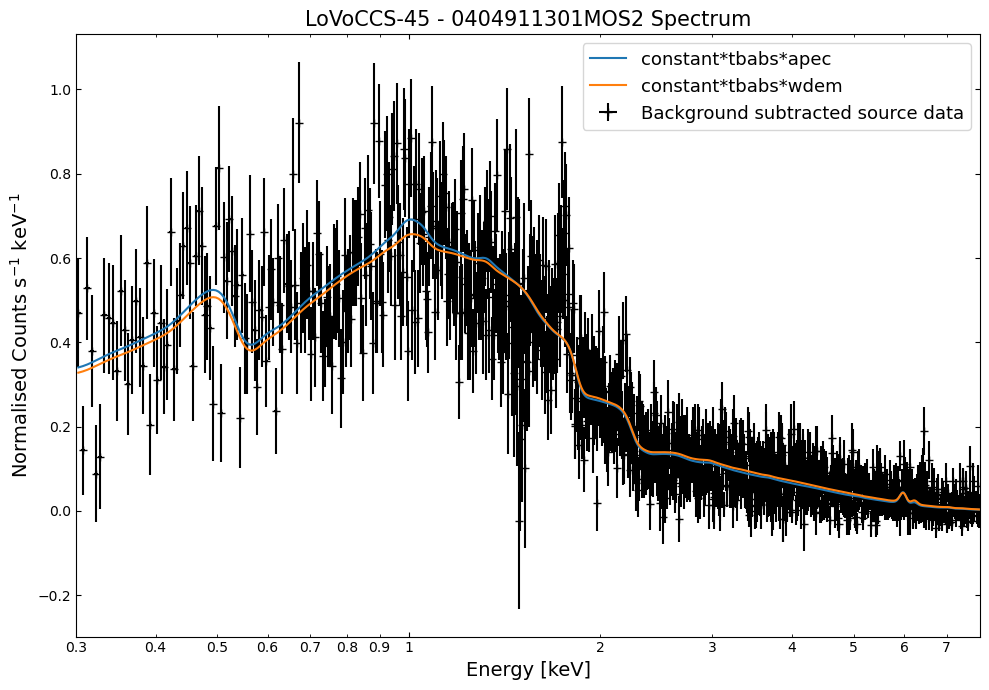

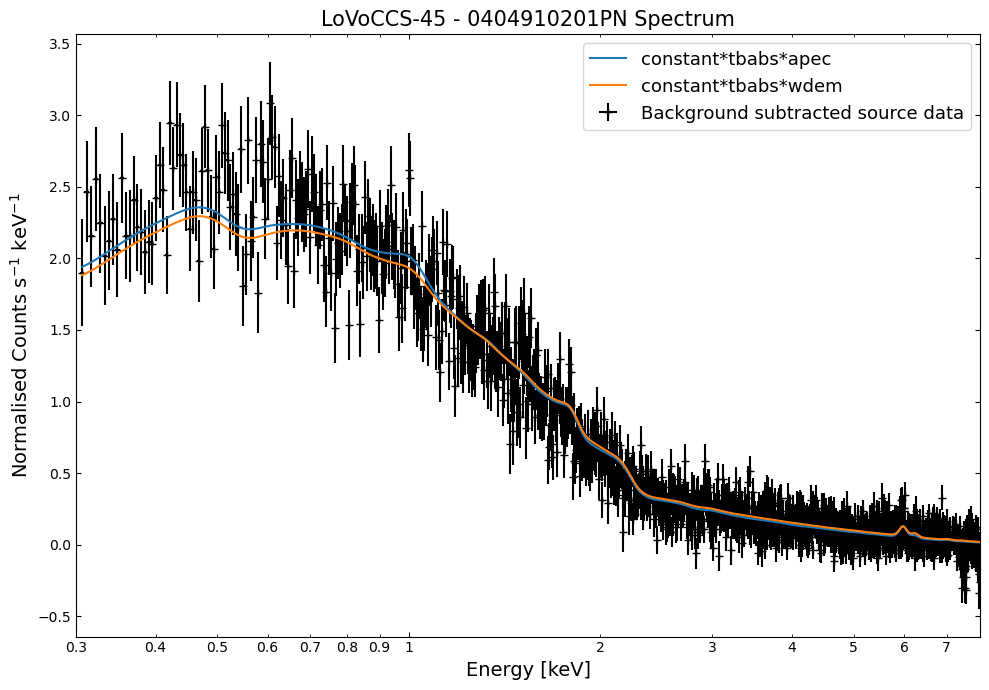

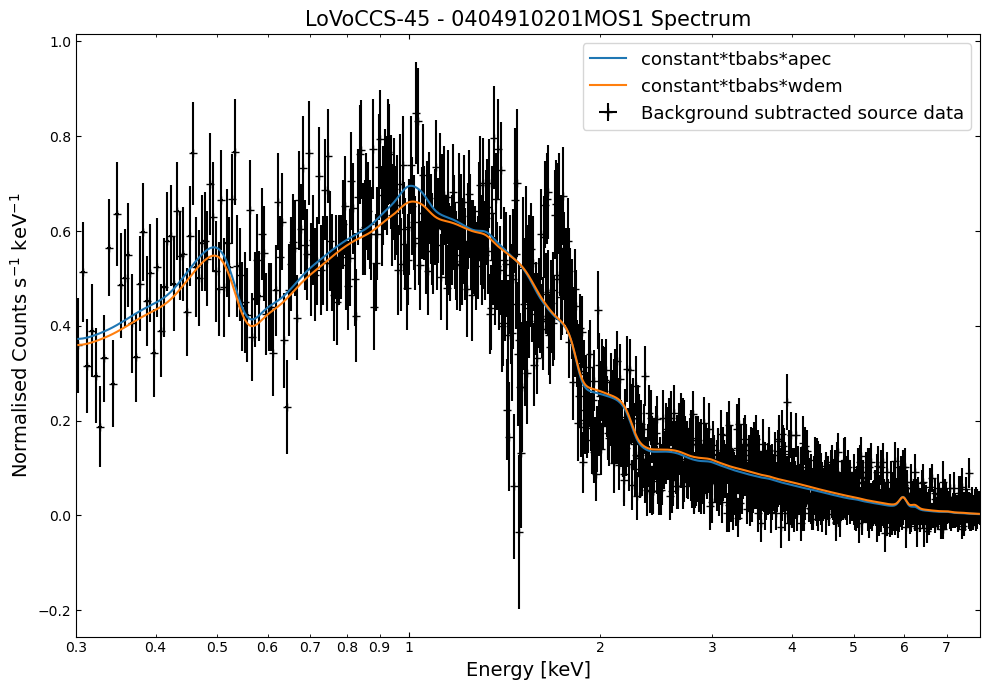

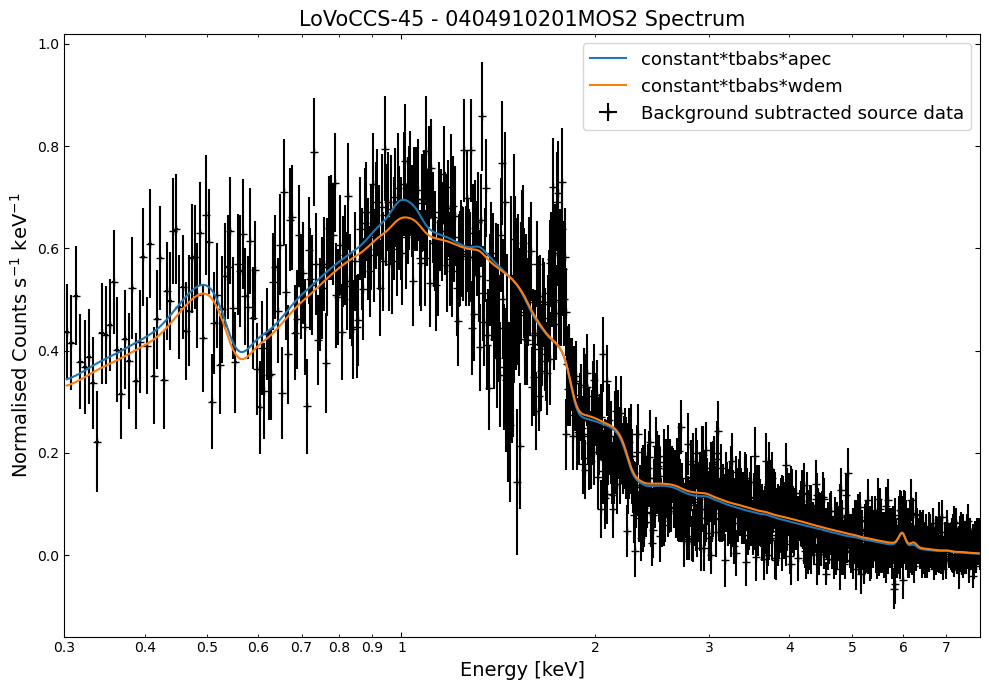

NoProductAvailableError: Cannot find any spectra matching your input.

In [18]:
for src in srcs:
    sps = src.get_spectra(src.r500)
    for sp in sps:
        sp.view()
    print('\n\n')

## Reading out the fit parameters

<font style="color:red">Some NoProductAvailableErrors are cropping up - this shouldn't happen and links back to the decimal places to which I store radii (very bad past decision)</font>

In [9]:
t_maxes = []
betas = []
inv_slopes = []
for src in srcs:
    try:
        tm = src.get_results('r500', 'constant*tbabs*wdem', par='Tmax')
        beta = src.get_results('r500', 'constant*tbabs*wdem', par='beta')
        inv_slope = src.get_results('r500', 'constant*tbabs*wdem', par='inv_slope')
        
        t_maxes.append(tm)
        betas.append(beta)
        inv_slopes.append(inv_slope)
        
    except ModelNotAssociatedError:
        t_maxes.append([np.NaN, np.NaN, np.NaN])
        betas.append([np.NaN, np.NaN, np.NaN])
        inv_slopes.append([np.NaN, np.NaN, np.NaN])
        
    except NoProductAvailableError:
        print(src.name)
        t_maxes.append([np.NaN, np.NaN, np.NaN])
        betas.append([np.NaN, np.NaN, np.NaN])
        inv_slopes.append([np.NaN, np.NaN, np.NaN])
        
t_maxes = np.array(t_maxes)
betas = np.array(betas)
inv_slopes = np.array(inv_slopes)

LoVoCCS-46
LoVoCCS-61
LoVoCCS-95


## Reading out fit luminosities

Arguably the most interesting part of this model fit - the global luminosities. It is possible that they are more accurate global luminosities for these very well observed clusters than assuming a single, isothermal, model for emission from the ICM. That utility is slightly tempered by how difficult it is to get these models to converge unfortunately, but these luminosities should be interesting:

In [10]:
lx52 = srcs.Lx(srcs.r500, 'constant*tbabs*wdem', lo_en=Quantity(0.5, 'keV'), hi_en=Quantity(2.0, 'keV'), 
               quality_checks=False)
lxbol = srcs.Lx(srcs.r500, 'constant*tbabs*wdem', lo_en=Quantity(0.01, 'keV'), hi_en=Quantity(100.0, 'keV'), 
                quality_checks=False)

/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/xga/samples/base.py:311: UserWarning: constant*tbabs*wdem has not been fitted to these spectra of LoVoCCS-3; available models are constant*tbabs*apec
  warn(str(err))
/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/xga/samples/base.py:311: UserWarning: constant*tbabs*wdem has not been fitted to these spectra of LoVoCCS-10; available models are constant*tbabs*apec
  warn(str(err))
/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/xga/samples/base.py:311: UserWarning: constant*tbabs*wdem has not been fitted to these spectra of LoVoCCS-24; available models are constant*tbabs*apec
  warn(str(err))
/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/xga/samples/base.py:311: UserWarning: constant*tbabs*wdem has not been fitted to these spectra of LoVoCCS-31; available models are constant*tbabs*apec
  warn(str(err))
/mnt/home/tur

We also read out the soft-band luminosities from the 'fiducial' plasma model (APEC) fits, as a basis for comparison:

In [36]:
lx52_sing = srcs.Lx(srcs.r500, 'constant*tbabs*apec', quality_checks=False)

/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/xga/samples/base.py:311: UserWarning: constant*tbabs*apec has not been fitted to these spectra of LoVoCCS-7; available models are constant*tbabs*wdem
  warn(str(err))
/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/xga/samples/base.py:311: UserWarning: constant*tbabs*apec has not been fitted to these spectra of LoVoCCS-17; available models are constant*tbabs*wdem
  warn(str(err))
/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/xga/samples/base.py:311: UserWarning: constant*tbabs*apec has not been fitted to these spectra of LoVoCCS-20; available models are constant*tbabs*wdem
  warn(str(err))
/mnt/home/turne540/software/anaconda3/envs/xga_env/lib/python3.8/site-packages/xga/samples/base.py:311: UserWarning: constant*tbabs*apec has not been fitted to these spectra of LoVoCCS-22; available models are constant*tbabs*wdem
  warn(str(err))
/mnt/home/tur

## Examining the fit results

We make some summary plots of the fit results, including the output luminosities. We also compare the luminosities for the temperature continuum model to those of the standard APEC model.

### Luminosity distributions

We show the distributions of the soft-band and bolometric unabsorbed luminosity: 

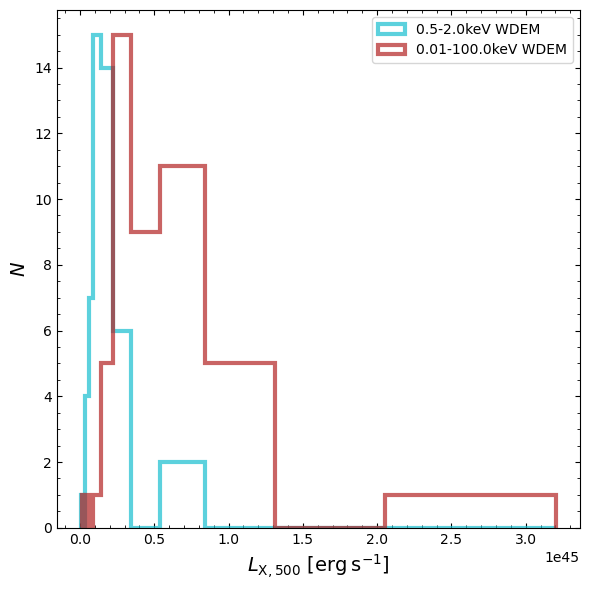

In [56]:
bin_bound = [np.nanmin([np.nanmin(lx52[:, 0].value), np.nanmin(lxbol[:, 0].value)]), 
             np.nanmax([np.nanmax(lx52[:, 0].value), np.nanmax(lxbol[:, 0].value)])]
bins = np.logspace(np.log10(bin_bound[0]), np.log10(bin_bound[1]), 15)

plt.figure(figsize=(6, 6))
plt.minorticks_on()
plt.tick_params(which='both', direction='in', top=True, right=True)

plt.hist(lx52[:, 0].value, bins=bins, alpha=0.7, color='tab:cyan', histtype='step', linewidth=3, 
         label="0.5-2.0keV WDEM")
plt.hist(lxbol[:, 0].value, bins=bins, alpha=0.7, color='firebrick', histtype='step', linewidth=3, 
         label="0.01-100.0keV WDEM")

plt.xlabel(r"$L_{\rm{X,500}}$ [$\rm{erg}\:s^{-1}$]", fontsize=14)
plt.ylabel(r"$N$", fontsize=14)

plt.legend()
plt.tight_layout()
plt.show()

### WDEM vs APEC Luminosities

We plot the soft-band luminosities measured using the WDEM (temperature-continuum) and APEC (fiducial model) fits against one another - to see how they compare. First of all, we remove entries in the WDEM luminosity measurements that have negative uncertainties:

In [60]:
lx52[np.where(lx52[:, 1:] < 0)[0], :] = np.NaN

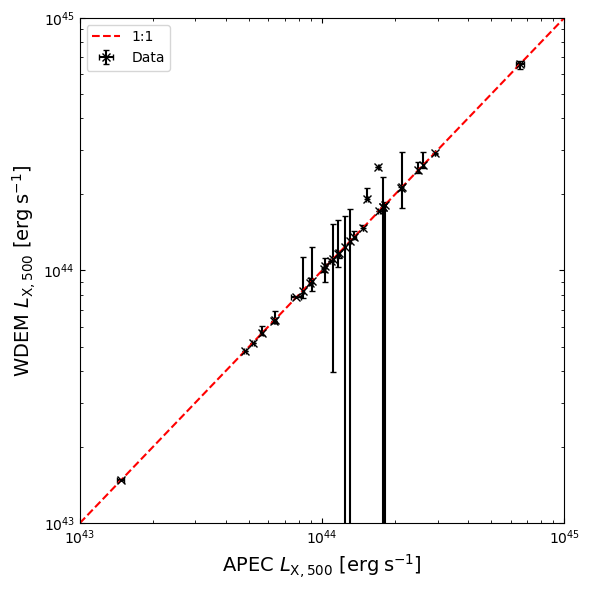

In [66]:
plt.figure(figsize=(6, 6))
plt.minorticks_on()
plt.tick_params(which='both', direction='in', top=True, right=True)

plt.errorbar(lx52_sing[:, 0].value, lx52[:, 0].value, yerr=lx52[:, 1:].value.T, xerr=lx52_sing[:, 1:].value.T, 
             fmt='kx', capsize=2, label='Data')
plt.plot([1e+43, 1e+45], [1e+43, 1e+45], color='red', linestyle='dashed', label='1:1')

plt.xlim([1e+43, 1e+45])
plt.ylim([1e+43, 1e+45])

plt.xlabel(r"APEC $L_{\rm{X,500}}$ [$\rm{erg}\:s^{-1}$]", fontsize=14)
plt.ylabel(r"WDEM $L_{\rm{X,500}}$ [$\rm{erg}\:s^{-1}$]", fontsize=14)

plt.xscale('log')
plt.yscale('log')

plt.legend()
plt.tight_layout()
plt.show()

Another way of examining the same comparison is through the ratio of the WDEM and APEC luminosities:

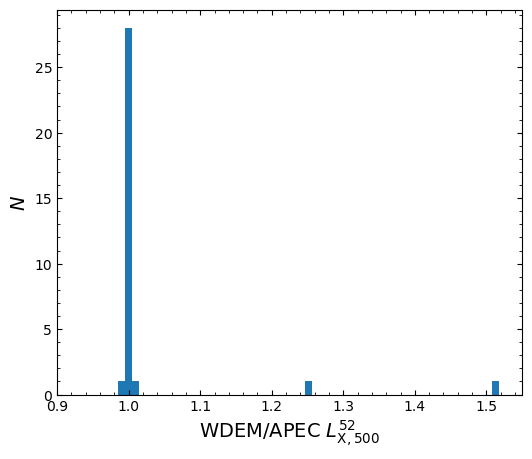

In [84]:
bins = np.linspace(0, 2, 200)


plt.figure(figsize=(6, 5))
plt.minorticks_on()
plt.tick_params(which='both', direction='in', top=True, right=True)

plt.hist((lx52[:, 0] / lx52_sing[:, 0]).value, bins=bins, color='tab:blue')

plt.ylabel(r'$N$', fontsize=14)
plt.xlabel(r'WDEM/APEC $L^{52}_{\rm{X,500}}$', fontsize=14)

plt.xlim([0.9, 1.55])
plt.show()

## Saving the results to a file

In [116]:
dat = np.concatenate([srcs.names[..., None], t_maxes, betas, inv_slopes, lx52.value, lxbol.value], axis=1)
cols = ['LoVoCCS_name', 'Tmax', 'Tmax-', 'Tmax+', 'beta', 'beta-', 'beta+', 
        'inv_slope', 'inv_slope-', 'inv_slope+', 'Lx500_0.5-2.0', 'Lx500_0.5-2.0-', 'Lx500_0.5-2.0+', 
        'Lx500_0.01-100.0', 'Lx500_0.01-100.0-', 'Lx500_0.01-100.0+']
wdem_res = pd.DataFrame(dat, columns=cols)
wdem_res.head(5)

,LoVoCCS_name,Tmax,Tmax-,Tmax+,beta,beta-,beta+,inv_slope,inv_slope-,inv_slope+,Lx500_0.5-2.0,Lx500_0.5-2.0-,Lx500_0.5-2.0+,Lx500_0.01-100.0,Lx500_0.01-100.0-,Lx500_0.01-100.0+
0,LoVoCCS-0,10.6872,0.0589890300000011,0.1327253599999984,0.0104363,0.0104363,0.01110590952,0.691923,0.0537547082999999,0.0479603939,6.5371545760000005e+44,2.516517815147142e+43,2.0361674505742602e+43,2.5410418990000002e+45,9.072523744864327e+43,1.4271413041495788e+44
1,LoVoCCS-3,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2,LoVoCCS-6,8.9746,0.4806359640000011,0.4439152209999992,0.0116032,0.0116032,0.0141252236,0.828112,0.1237836748999999,0.1396972452,1.7789854270000003e+44,3.34969145288603e+42,3.7868989941716004e+41,6.312798078e+44,3.45571404636337e+42,1.944580001719801e+43
3,LoVoCCS-7,11.0876,0.3602017899999996,0.5810633099999993,0.01,0.01,0.00176102809,1.29786,0.118076179,0.217862084,3.035988926e+44,7.347256148105711e+42,3.71826353532108e+42,1.1275123320000002e+45,4.2957772301420565e+43,6.283636890949322e+43
4,LoVoCCS-8,7.56614,0.1173100199999996,0.1022045729999998,0.0161957,0.0161957,0.0117861562899999,0.641968,0.0318362288,0.0416972203,2.9179699690000005e+44,2.4961541237270203e+42,1.0550632664461502e+42,9.825904514e+44,4.90219574254722e+42,8.48859322611741e+42


In [118]:
join_samp = pd.read_csv('../../outputs/results/ltr_r500_pipeline_results.csv')
join_samp = join_samp[['name', 'LoVoCCS_name', 'LoVoCCSID']]
wdem_res = pd.merge(join_samp, wdem_res, on='LoVoCCS_name', how='outer')
wdem_res.head(5)

,name_x,LoVoCCS_name,LoVoCCSID_x,name_y,LoVoCCSID_y,Tmax,Tmax-,Tmax+,beta,beta-,beta+,inv_slope,inv_slope-,inv_slope+,Lx500_0.5-2.0,Lx500_0.5-2.0-,Lx500_0.5-2.0+,Lx500_0.01-100.0,Lx500_0.01-100.0-,Lx500_0.01-100.0+
0,LoVoCCS-0,LoVoCCS-0,0,LoVoCCS-0,0,10.6872,0.0589890300000011,0.1327253599999984,0.0104363,0.0104363,0.01110590952,0.691923,0.0537547082999999,0.0479603939,6.5371545760000005e+44,2.516517815147142e+43,2.0361674505742602e+43,2.5410418990000002e+45,9.072523744864327e+43,1.4271413041495788e+44
1,LoVoCCS-1,LoVoCCS-1,1,LoVoCCS-1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,LoVoCCS-2,LoVoCCS-2,2,LoVoCCS-2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,LoVoCCS-3,LoVoCCS-3,3,LoVoCCS-3,3,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
4,LoVoCCS-4,LoVoCCS-4,4,LoVoCCS-4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
